## Timp NDSI coverage
#### Leif
Feb 2025

In [1]:
import pandas as pd
import geopandas as gpd
from geopandas import GeoDataFrame
import numpy as np
from shapely.geometry import Point
from matplotlib import pyplot as plt

import ee

import geemap 

import json

import os

In [2]:
ee.Authenticate()
ee.Initialize()

Enter verification code:  4/1ASVgi3IDqWePs0tRrTFfZfBKWw6qy4UD5ba-Ru2eO9HOpCEEzM2FzH4hBm0



Successfully saved authorization token.


### Create boundary and time series
Repeat fSCA
NSDI Landsat

In [47]:
# filter rock glacier inventory
rg = geemap.shp_to_ee('shp/timp-rg/timp.shp')
rg2 = ee.FeatureCollection('shp/timp-rg/timp.shp') #.style({fillColor:'00000000'})

In [48]:
#inspect
# print(rg2.getInfo())
# vis_params = {
#     'color': '000000', 
#     'colorOpacity': 0,
#     'pointSize': 3,
#     'pointShape': 'circle',
#     'width': 2,
#     'lineType': 'solid',
#     'fillColor': '000000',
#     'fillColorOpacity': '0'    
# }

In [201]:
# cannot find file with feature collection
# timp_rg = ee.FeatureCollection('/Users/mattolson/src/glac-gee/shp/timp-rg/timp')
timp_rg = rg

Map.addLayer(timp_rg, {}, "Timpanogos rock glacier", False)
Map.centerObject(rg, 15)
vis_params = {
    'color': '000000', 
    'pointSize': 3,
    'pointShape': 'circle',
    'width': 2,
    'lineType': 'solid',
    'fillColor': '00000000',
}

Map.addLayer(timp_rg.style(**vis_params), {}, "Styled vector")
Map

Map(bottom=6328263.0, center=[40.389565168100816, -111.64058143725468], controls=(WidgetControl(options=['posi…

In [4]:
rg.bounds

<bound method ApiFunction.importApi.<locals>.MakeBoundFunction.<locals>.<lambda> of <ee.featurecollection.FeatureCollection object at 0x11327be60>>

In [150]:
# Define the region of interest 
# wasatch = ee.Geometry.Rectangle(-111.6, 40.3, -111.5, 40.4)
wasatch = rg.bounds

# Define the date range
start_date = '2015-08-01'
end_date = '2024-10-15'

# Define the 
s2 = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')

# Filter the collection by date range and region
s2_filtered = s2.filterDate(start_date, end_date).filterBounds(rg) \
                        .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 10)) \
                        .filter(ee.Filter.calendarRange(8, 10, 'month'))

In [69]:
s2_filtered

Name,Description
B1,Aerosols
B2,Blue
B3,Green
B4,Red
B5,Red Edge 1
B6,Red Edge 2
B7,Red Edge 3
B8,NIR
B8A,Red Edge 4
B9,Water vapor


In [73]:
def s2_ndsi(image):
  index= image.normalizedDifference(['B3','B11']).rename('ndsi');
  return image.addBands(index)

def clip_to_polygon(image):
  return(image).clip(rg)

def scale_s2(img):
    return img.divide(10000)

In [95]:
# scale imagery
s2_scale_clip = s2_filtered.map(scale_s2).map(clip_to_polygon)

In [196]:
import datetime
# Extract timestamps from the images
# second_image_timestamp = ee.Image(s2_scale_clip.toList(10).get(1)).get('system:time_start')
# ee.Date(second_image_timestamp).format('YYYY-MM-dd HH:mm:ss').getInfo()
# s2_scale_clip.first().getInfo()
type(ee.Image(s2_scale_clip.toList(10).get(1)).get('system:index'))

image_id = ee.Image(s2_scale_clip.toList(10).get(1)).get('system:index').getInfo()
date_part = image_id.split('T')[0]
date_obj = datetime.datetime.strptime(date_part, '%Y%m%d')
formatted_date = date_obj.strftime('%m-%d-%Y')
formatted_date

'08-10-2020'

In [193]:
ee.Image(s2_scale_clip.toList(10).get(1)).get('system:index').getInfo()

'20200810T180921_20200810T181917_T12TVK'

In [178]:
# Create a map object
Map = geemap.Map()

vis_params = {'min': 0, 'max': 0.35, 'bands': ['B4', 'B3', 'B2']}
Map.centerObject(rg, 15)
Map.addLayer(s2_scale_clip.first(), vis_params, 'Scaled Sentinel-2')

Map

Map(center=[40.389565168100816, -111.64058143725468], controls=(WidgetControl(options=['position', 'transparen…

In [170]:
s2_scale_clip.toList(1).get(0)

In [197]:
Map = geemap.Map()

scene_number = 6

image_id = ee.Image(s2_scale_clip.toList(10).get(scene_number)).get('system:index').getInfo()
date_part = image_id.split('T')[0]
date_obj = datetime.datetime.strptime(date_part, '%Y%m%d')
formatted_date = date_obj.strftime('%m-%d-%Y')

vis_params = {'min': 0, 'max': 0.35, 'bands': ['B4', 'B3', 'B2']}
Map.centerObject(rg, 15)
Map.addLayer(ee.Image(s2_scale_clip.toList(10).get(scene_number)), vis_params, formatted_date)

Map

Map(center=[40.389565168100816, -111.64058143725468], controls=(WidgetControl(options=['position', 'transparen…

In [75]:
s2_ndsi_clip

Name,Description
B1,Aerosols
B2,Blue
B3,Green
B4,Red
B5,Red Edge 1
B6,Red Edge 2
B7,Red Edge 3
B8,NIR
B8A,Red Edge 4
B9,Water vapor


In [97]:
# calculate ndsi
def s2_ndsi(image):
  index= image.normalizedDifference(['B3','B11']).rename('ndsi');
  return image.addBands(index)
    
s2_ndsi = s2_scale_clip.map(s2_ndsi)

# plot
Map = geemap.Map()
palette = ['#d73027', '#f46d43', '#fdae61', '#fee08b', '#d9ef8b', '#a6d96a', '#66bd63', '#1a9850']
vis_params = {'min': -1, 'max': 1, 'bands':'ndsi','palette': ['000FFF', '00FFFF']}
Map.centerObject(rg, 14)
Map.addLayer(s2_ndsi.first(), vis_params, 'NDSI Sentinel-2')
Map

Map(center=[40.389565168100816, -111.64058143725468], controls=(WidgetControl(options=['position', 'transparen…

In [125]:
Map = geemap.Map()
ndsi_params = {'min': -1, 'max': 1, 'bands':'ndsi','palette': ['000FFF', '00FFFF']}
vis_params = {'min': 0, 'max': 0.35, 'bands': ['B4', 'B3', 'B2']}
Map.centerObject(rg, 14)
Map.addLayer(s2_scale_clip.first(), vis_params, 'RGB')
Map.addLayer(s2_ndsi.first().updateMask(s2_ndsi.first().gte(0.2)), ndsi_params, 'NDSI > 0.4')
Map

Map(center=[40.389565168100816, -111.64058143725468], controls=(WidgetControl(options=['position', 'transparen…

In [140]:
def threshold1_image(image):
    # return image.gte(-1).And(image.lte(0.2)).selfMask()
    return image.gte(0.2).selfMask()

s2_thresh = s2_ndsi.map(threshold1_image)

In [141]:
s2_thresh
# s2_thresh.select(0)

Name,Description
B1,Aerosols
B2,Blue
B3,Green
B4,Red
B5,Red Edge 1
B6,Red Edge 2
B7,Red Edge 3
B8,NIR
B8A,Red Edge 4
B9,Water vapor


In [142]:
Map = geemap.Map()
ndsi_params = {'min': -1, 'max': 1, 'bands':'ndsi','palette': ['000FFF', '00FFFF']}
Map.centerObject(rg, 14)
Map.addLayer(s2_thresh.first(), ndsi_params, 'NDSI > 0.2')
Map

Map(center=[40.389565168100816, -111.64058143725468], controls=(WidgetControl(options=['position', 'transparen…

In [116]:

# Get the projection for Band 3 (Green) and Band 11 (SWIR1)
band_3_resolution = s2_thresh.first().select('B3').projection().nominalScale().getInfo()  # 10 meters
band_11_resolution = s2_thresh.first().select('B11').projection().nominalScale().getInfo()  # 20 meters

print("Band 3 resolution:", band_3_resolution)  # Expected to be 10 meters
print("Band 11 resolution:", band_11_resolution)  # Expected to be 20 meters


Band 3 resolution: 10
Band 11 resolution: 20


In [143]:
# Function to count pixels in an image
def count_pixels(image):
    total_pixels = image.select(0).reduceRegion(
        reducer=ee.Reducer.count(),
        geometry=rg,
        scale=20,  # Adjust scale as needed
        maxPixels=1e13
    ).get(image.bandNames().get(0))
    return ee.Feature(None, {'image_id': image.id(), 'pixel_count': total_pixels})

# Map the function over the image collection
features = s2_thresh.map(count_pixels)

# Convert to a FeatureCollection and then to a pandas DataFrame
feature_collection = ee.FeatureCollection(features)
df = geemap.ee_to_df(feature_collection)

# Display the table
print(df)

                                  image_id  pixel_count
0   20200808T181919_20200808T183225_T12TVK           76
1   20200810T180921_20200810T181917_T12TVK          106
2   20200815T180919_20200815T181843_T12TVK           84
3   20200818T181919_20200818T182541_T12TVK           64
4   20200828T181919_20200828T182414_T12TVK           20
..                                     ...          ...
60  20240923T180959_20240923T181330_T12TVK          223
61  20240928T181131_20240928T181716_T12TVK           56
62  20241003T181119_20241003T181935_T12TVK           42
63  20241011T182301_20241011T182507_T12TVK            2
64  20241013T181219_20241013T181445_T12TVK           19

[65 rows x 2 columns]


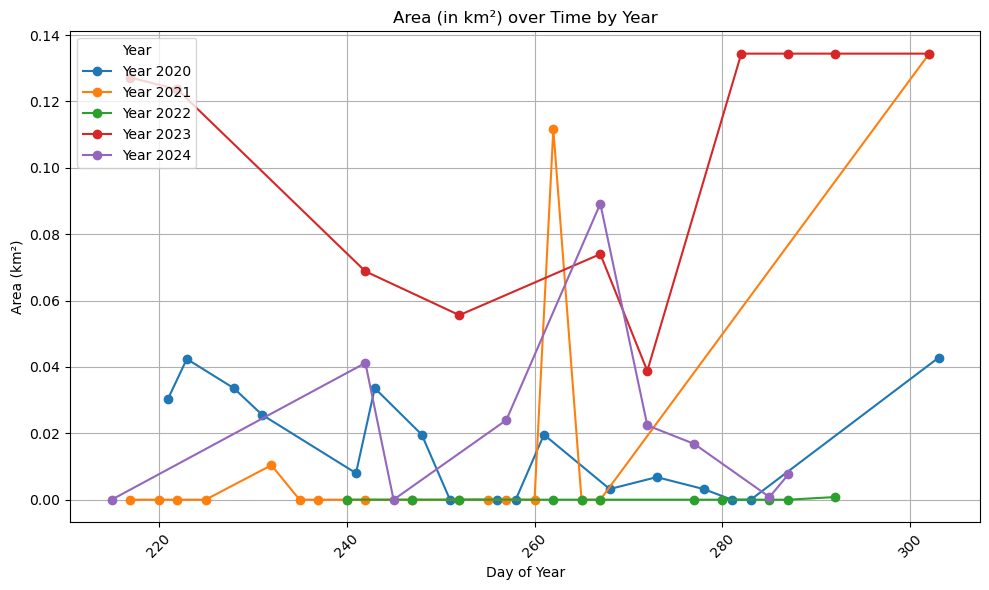

In [148]:
from datetime import datetime

# Function to extract date from image name and convert to datetime
def extract_date(image_name):
    # Extract the first part of the image name (before the first 'T')
    date_str = image_name.split('T')[0]
    
    # Convert the string into a datetime object
    date_obj = datetime.strptime(date_str, '%Y%m%d')
    
    return date_obj

df2 = df

# Apply the function to the 'image_name' column
df2['date'] = df2['image_id'].apply(extract_date)

# Calculate the area in square meters
df2['area_m2'] = df2['pixel_count'] * 400  # 400 m^2 per pixel (20m x 20m)
df2['area_km2'] = df['pixel_count'] * 400 / 1_000_000 # sq km

# Add a column for the day of the year
df['day_of_year'] = df['date'].dt.dayofyear

# Plotting the area (in km²) over time with color by year
plt.figure(figsize=(10, 6))

# Get unique years and plot each year with a different color
unique_years = df['date'].dt.year.unique()
for year in unique_years:
    year_data = df[df['date'].dt.year == year]
    plt.plot(year_data['day_of_year'], year_data['area_km2'], label=f'Year {year}', marker='o')

plt.title('Area (in km²) over Time by Year')
plt.xlabel('Day of Year')
plt.ylabel('Area (km²)')
plt.grid(True)
plt.xticks(rotation=45)
plt.legend(title="Year", loc="upper left")
plt.tight_layout()

# Show the plot
plt.show()


In [ ]:
# Get the second image in the collection (index 1)
second_image = s2_thresh.toList(s2_thresh.size()).get(4)

# Cast to ee.Image
second_image = ee.Image(second_image)

# Define visualization parameters (optional)
vis_params = {'min': 0, 'max': 1, 'palette': ['000000', '00FFFF'], 'bands':'ndsi'}

# Add the second image to the map
Map.addLayer(second_image, vis_params, 'Second Image')

# Center the map on the image (optional)
Map.centerObject(rg, 14)

# Display the map
Map

In [118]:
# # Function to count pixels in an image
# def count_pixels(image):
#     total_pixels = image.select(0).unmask(0).reduceRegion(
#         reducer=ee.Reducer.count(),
#         # geometry=roi,
#         scale=30,  # Adjust scale as needed
#         maxPixels=1e13
#     ).get(image.bandNames().get(0))
#     return ee.Feature(None, {'image_id': image.id(), 'pixel_count': total_pixels})

# # Map the function over the image collection
# features = s2_thresh.map(count_pixels)

# # Convert to a FeatureCollection and then to a pandas DataFrame
# feature_collection = ee.FeatureCollection(features)
# df = geemap.ee_to_df(feature_collection)

# # Display the table
# print(df)

In [ ]:
# stats
reducers = {
        "COUNT": ee.Reducer.count(),
        "MEAN": ee.Reducer.mean(),
        "MAXIMUM": ee.Reducer.max(),
        "MEDIAN": ee.Reducer.median(),
        "MINIMUM": ee.Reducer.min(),
        "MODE": ee.Reducer.mode(),
        "STD": ee.Reducer.stdDev(),
        "SUM": ee.Reducer.sum(),
        "VARIANCE": ee.Reducer.variance()}

zone_stats = image.reduceRegions(collection=s2_filtered, reducer=reducers[stats.upper()], scale=10).getInfo()
zone_stats = gpd.GeoDataFrame.from_features(zone_stats, crs='epsg:4326')

In [71]:
def scale_s2(img):
    return img.divide(10000)

s2_filtered.map(scale_s2)

Name,Description
B1,Aerosols
B2,Blue
B3,Green
B4,Red
B5,Red Edge 1
B6,Red Edge 2
B7,Red Edge 3
B8,NIR
B8A,Red Edge 4
B9,Water vapor


In [61]:
# Display the composites.
m = geemap.Map()
# m.set_center(-111.6406, 40.38957,  13)
m.centerObject(rg, 15)

# sentinel: numerical range of 0 to 65535
m.add_layer(
    s2_filtered.first().clip(rg),
    {'bands': ['B4', 'B3', 'B2'], 'min': 2000, 'max': 6000, 'gamma': 1.1},
    'Timpanogos',
)
# rgg = rg.style({'fillColor':'00000000'})
# m.add_layer(rg, {'fillColor': '00000000', 'color': '000000', 'width': 2,'lineType': 'solid'}, "Shapefile")
style = {'color': '000000ff', 'width': 2, 'fillColor': '00000000'}
m.addLayer(rg.style(**style), {}, "US States")
m

Map(center=[40.389565168100816, -111.64058143725468], controls=(WidgetControl(options=['position', 'transparen…

In [ ]:
## DOES NOT WORK
# IMplemented later
# filter for coverage

# Function to compute coverage
def compute_coverage(img):
    # Get the intersection between the image geometry and the ROI with the given tolerance
    tol = 20  # tolerance, in meters
    overlap = img.geometry().intersection(rg, tol)
    
    # Calculate the area of the intersection and the total image area
    overlap_area = overlap.area().divide(img.geometry().area())
    
    # Set the 'coverage' property for the image
    img_with_coverage = img.set('coverage', overlap_area)
    
    return img_with_coverage

# Apply the function over the collection and filter based on coverage > 0.8 or 1
s2_overlap = s2_filtered.map(compute_coverage).filter(ee.Filter.gt('coverage', 0.8))

### Landsat full scene analysis

In [ ]:
def NAIP_NDVI(image):
  index= image.normalizedDifference(['N','R']).rename('NDVI');
  return image.addBands(index)

def clip_to_polygon(image):
  return(image).clip(polygon)

def createTimeBand(image):
  return image.addBands(image.metadata('system:time_start').divide(3.154e10));

In [ ]:
def annual_images(y):
    range_year = ee.Filter.calendarRange(y, y, 'year')
    range_month = ee.Filter.calendarRange(start_month, end_month, 'month')
    filtered_dataset = (index_collection
                        .filter(range_year)
                        .filter(range_month)
                        .map(createTimeBand)) # Needed for linear regression 
    # Combine the mean and standard deviation reducers.
    if analysis == 'mean':
      reducers = ee.Reducer.mean().combine(
        reducer2=ee.Reducer.stdDev(),
        sharedInputs=True
      )
    elif analysis == 'min' or analysis == 'max':
      reducers = ee.Reducer.mean().combine(
        reducer2=ee.Reducer.minMax(),
        sharedInputs=True
      )
    elif analysis == 'median':
      reducers = ee.Reducer.mean().combine(
        reducer2=ee.Reducer.median(),
        sharedInputs=True
      )

# Use the combined reducer to get the mean and SD of the image.
    stats0 = filtered_dataset.reduce(
      reducer=reducers,
    )

    return stats0.set('year',y)

# adapted from https://gis.stackexchange.com/questions/392834/transform-google-earth-engine-script-to-python-with-landsat-8-temporal-data

In [67]:
# 2.75e-05	-0.2


In [60]:
# https://developers.google.com/earth-engine/guides/ic_filtering#colab-python
# Load Landsat 8 data, filter by date, month, and bounds.
collection = (
    ee.ImageCollection('LANDSAT/LC08/C02/T1_L2')
    # Three years of data
    .filterDate('2022-08-01', '2024-10-31')
    # Only Nov-Feb observations
    .filter(ee.Filter.calendarRange(8, 10, 'month'))
    # Intersecting ROI
    .filterBounds(ee.Geometry.Point(-111.6406, 40.38957))
)

# Also filter the collection by the CLOUD_COVER property.
filtered = collection.filter(ee.Filter.eq('CLOUD_COVER', 0))

# Create two composites to check the effect of filtering by CLOUD_COVER.
bad_composite = collection.mean()
good_composite = filtered.mean()

# Display the composites.
m = geemap.Map()
m.set_center(-111.6406, 40.38957,  13)
# m.add_layer(
#     bad_composite,
#     {'bands': ['SR_B4', 'SR_B2', 'SR_B1'], 'min': 0.05, 'max': 0.35, 'gamma': 1.1},
#     'Bad composite',
# )
m.add_layer(
    good_composite,
    {'bands': ['SR_B3', 'SR_B2', 'SR_B1'], 'min': 0.05, 'max': 0.35, 'gamma': 1.1},
    'Good composite',
)
m

Map(center=[40.38957, -111.6406], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=Searc…

In [52]:
# Load a Landsat 8 ImageCollection for a single path-row.
# collection = (
#     ee.ImageCollection('LANDSAT/LC08/C02/T1_TOA')
#     .filter(ee.Filter.eq('WRS_PATH', 44))
#     .filter(ee.Filter.eq('WRS_ROW', 34))
#     .filterDate('2014-03-01', '2014-08-01')
# )
display('Collection:', collection)

# Get the number of images.
count = collection.size()
display('Count:', count)

# Get the date range of images in the collection.
range = collection.reduceColumns(ee.Reducer.minMax(), ['system:time_start'])
display('Date range:', ee.Date(range.get('min')), ee.Date(range.get('max')))

# Get statistics for a property of the images in the collection.
sun_stats = collection.aggregate_stats('SUN_ELEVATION')
display('Sun elevation statistics:', sun_stats)

# Sort by a cloud cover property, get the least cloudy image.
image = ee.Image(collection.sort('CLOUD_COVER').first())
display('Least cloudy image:', image)

# Limit the collection to the 10 most recent images.
recent = collection.sort('system:time_start', False).limit(10)
display('Recent images:', recent)

'Collection:'

'Count:'

'Date range:'

'Sun elevation statistics:'

'Least cloudy image:'

'Recent images:'

## Chat GPT code

In [30]:
# FUNCTIONS
# Function to compute NDSI
def compute_ndsi(image):
    # NDSI = (Green - SWIR) / (Green + SWIR)
    green = image.select('B3')  # Green band
    swir = image.select('B6')   # SWIR band
    ndsi = green.subtract(swir).divide(green.add(swir)).rename('NDSI')
    return image.addBands(ndsi)

# Function to get cloud-free image closest to Oct 15th for each year
def get_cloud_free_image(year):
    # Filter Landsat collection for the year
    landsat_collection = ee.ImageCollection('LANDSAT/LC08/C02/T1_L2')\
        .filterBounds(roi)\
        .filterDate(f'{year}-01-01', f'{year}-12-31')\
        .filter(ee.Filter.lt('system:cloud_coverage', 30))  # Filter cloud cover < 30%

    # Select closest image to October 15th
    start_date = ee.Date(f'{year}-10-01')
    end_date = ee.Date(f'{year}-10-31')
    closest_image = landsat_collection.filterDate(start_date, end_date)\
        .sort('system:time_start')\
        .first()

    return closest_image

# Function to extract area with NDSI > 0.4 for each year
def extract_ndsi_area(year):
    image = get_cloud_free_image(year)
    if image is None:
        return None

    # Compute NDSI
    image_with_ndsi = compute_ndsi(image)

    # Mask out the area where NDSI > 0.4
    ndsi_mask = image_with_ndsi.select('NDSI').gt(0.4)

    # Clip the mask to the region of interest (ROI)
    clipped_mask = ndsi_mask.clip(roi)

    # Calculate area of NDSI > 0.4 within ROI
    area_image = clipped_mask.multiply(ee.Image.pixelArea())  # Area in square meters
    total_area = area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=roi,
        scale=30,  # pixel size for Landsat
        maxPixels=1e8
    )

    return total_area

In [35]:
# Load the shapefile using geopandas
shapefile_path = 'shp/timp-rg/timp_WGS84.shp'  # replace with your shapefile path
gdf = gpd.read_file(shapefile_path)
# Convert to GeoJSON for Earth Engine
geometry = gdf.geometry.iloc[0]  # assuming one geometry in shapefile
roi = geemap.geopandas_to_ee(gdf)  # Convert to Earth Engine object

# Set date range for analysis (assuming years from 1984 to 2023)
start_year = 1984
start_year = 2013
end_year = 2023

In [36]:
# Loop over each year and extract NDSI area
ndsi_areas = {}
for year in range(start_year, end_year + 1):
    total_area = extract_ndsi_area(year)
    if total_area:
        ndsi_areas[year] = total_area.getInfo()

# Print the results
for year, area in ndsi_areas.items():
    print(f"Year: {year}, Area with NDSI > 0.4: {area['NDSI']} square meters")

EEException: Image.bandNames: Parameter 'image' is required and may not be null.

In [34]:
# all output - at once

# Load the shapefile using geopandas
shapefile_path = 'shp/timp-rg/timp.shp'  # replace with your shapefile path
gdf = gpd.read_file(shapefile_path)
# Convert to GeoJSON for Earth Engine
geometry = gdf.geometry.iloc[0]  # assuming one geometry in shapefile
roi = geemap.geopandas_to_ee(gdf)  # Convert to Earth Engine object

# Set date range for analysis (assuming years from 1984 to 2023)
start_year = 1984
end_year = 2023

# Function to compute NDSI
def compute_ndsi(image):
    # NDSI = (Green - SWIR) / (Green + SWIR)
    green = image.select('B3')  # Green band (for Landsat 8)
    swir = image.select('B6')   # SWIR band (for Landsat 8)
    ndsi = green.subtract(swir).divide(green.add(swir)).rename('NDSI')
    return image.addBands(ndsi)

# Function to get cloud-free image closest to Oct 15th for each year
def get_cloud_free_image(year):
    # Filter Landsat collection for the year
    landsat_collection = ee.ImageCollection('LANDSAT/LC08/C02/T1_L2')\
        .filterBounds(roi)\
        .filterDate(f'{year}-01-01', f'{year}-12-31')\
        .filter(ee.Filter.lt('system:cloud_coverage', 30))  # Filter cloud cover < 30%

    # Select closest image to October 15th
    start_date = ee.Date(f'{year}-10-01')
    end_date = ee.Date(f'{year}-10-31')
    closest_image = landsat_collection.filterDate(start_date, end_date)\
        .sort('system:time_start')\
        .first()

    # Check if the image is valid
    if closest_image is None:
        print(f"No valid image found for {year}")
        return None
    return closest_image

# Function to extract area with NDSI > 0.4 for each year
def extract_ndsi_area(year):
    image = get_cloud_free_image(year)
    if image is None:
        return None

    # Ensure the image has the required bands before processing
    if image.bandNames().getInfo() is None or 'B3' not in image.bandNames().getInfo() or 'B6' not in image.bandNames().getInfo():
        print(f"Missing bands in the image for year {year}. Skipping.")
        return None

    # Compute NDSI
    image_with_ndsi = compute_ndsi(image)

    # Mask out the area where NDSI > 0.4
    ndsi_mask = image_with_ndsi.select('NDSI').gt(0.4)

    # Clip the mask to the region of interest (ROI)
    clipped_mask = ndsi_mask.clip(roi)

    # Calculate area of NDSI > 0.4 within ROI
    area_image = clipped_mask.multiply(ee.Image.pixelArea())  # Area in square meters
    total_area = area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=roi,
        scale=30,  # pixel size for Landsat
        maxPixels=1e8
    )

    return total_area

# Loop over each year and extract NDSI area
ndsi_areas = {}
for year in range(start_year, end_year + 1):
    total_area = extract_ndsi_area(year)
    if total_area:
        ndsi_areas[year] = total_area.getInfo()

# Print the results
for year, area in ndsi_areas.items():
    print(f"Year: {year}, Area with NDSI > 0.4: {area['NDSI']} square meters")


EEException: Image.bandNames: Parameter 'image' is required and may not be null.

In [61]:
import ee

def get_cloud_free_image(date, geometry, collection_id='COPERNICUS/S2_SR'):
    """
    Finds the annual cloud-free image closest to a given date.

    Args:
        date (ee.Date): The target date.
        geometry (ee.Geometry): The region of interest.
        collection_id (str): The ID of the image collection.

    Returns:
        ee.Image: The cloud-free image closest to the given date.
    """

    def mask_clouds(image):
        """Masks clouds in an image using the QA60 band."""
        qa = image.select('QA60')
        cloud_bit_mask = 1 << 10
        cirrus_bit_mask = 1 << 11
        mask = qa.bitwiseAnd(cloud_bit_mask).eq(0)
        mask = mask.And(qa.bitwiseAnd(cirrus_bit_mask).eq(0))
        return image.updateMask(mask)

    start_date = ee.Date(date.get('year')).advance(-6, 'month')
    end_date = ee.Date(date.get('year')).advance(6, 'month')

    collection = (
        ee.ImageCollection(collection_id)
        .filterBounds(geometry)
        .filterDate(start_date, end_date)
        .map(mask_clouds)
        .sort('CLOUDY_PIXEL_PERCENTAGE')
    )

    return collection.first()

# Example usage
date = ee.Date('2022-06-15')
geometry = ee.Geometry.Point(-122.27, 37.87)  # San Francisco

image = get_cloud_free_image(date, geometry)

# Print image metadata
print(image.getInfo())

# Visualize the image
m = geemap.Map()
m.addLayer(image, {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 3000}, 'Cloud-free Image')

None


EEException: Image.visualize: Parameter 'image' is required and may not be null.

In [198]:
def check_fully_masked(image, roi):
    # Apply the mask (clip and mask the image based on some condition)
    image_masked = image.clip(roi).selfMask()  # Clip and apply mask
    
    # Count total pixels (using reduceRegion)
    total_pixels = image_masked.reduceRegion(
        reducer=ee.Reducer.count(),
        geometry=roi,
        scale=20,  # Adjust scale as needed
        maxPixels=1e13
    ).get(image.bandNames().get(0))  # Get the count for the first band (or adjust for multi-band)

    # Count non-masked pixels by reducing the region with the "count" reducer on the mask
    non_masked_pixels = image_masked.mask().reduceRegion(
        reducer=ee.Reducer.count(),
        geometry=roi,
        scale=20,
        maxPixels=1e13
    ).get(image.bandNames().get(0))

    # Check if the count of non-masked pixels is equal to the total pixels
    is_fully_masked = ee.Algorithms.If(
        ee.Number(non_masked_pixels).subtract(ee.Number(total_pixels)).abs().lt(1),  # Small threshold to allow comparison
        True,
        False
    )
    
    # Return a feature with the result (True/False)
    return ee.Feature(None, {'image_id': image.id(), 'is_fully_masked': is_fully_masked})

# Apply the check to all images in the collection
image_check_results = s2_ndsi.map(lambda image: check_fully_masked(image, rg))

# Convert the results to a FeatureCollection and then to a pandas DataFrame
feature_collection = ee.FeatureCollection(image_check_results)
df = geemap.ee_to_df(feature_collection)

# Display the result
print(df)


                                  image_id  is_fully_masked
0   20200808T181919_20200808T183225_T12TVK            False
1   20200810T180921_20200810T181917_T12TVK             True
2   20200815T180919_20200815T181843_T12TVK             True
3   20200818T181919_20200818T182541_T12TVK            False
4   20200828T181919_20200828T182414_T12TVK            False
..                                     ...              ...
60  20240923T180959_20240923T181330_T12TVK             True
61  20240928T181131_20240928T181716_T12TVK             True
62  20241003T181119_20241003T181935_T12TVK             True
63  20241011T182301_20241011T182507_T12TVK            False
64  20241013T181219_20241013T181445_T12TVK             True

[65 rows x 2 columns]


In [157]:
import geemap
import ee

# Initialize Earth Engine
ee.Initialize()

# Load your image collection (assuming it's `s2_ndsi`)
# For example, we'll use the first 5 images
first_5_images = s2_ndsi.limit(5)

# Create a Map
Map = geemap.Map(center=[10, 10], zoom=14)

# Function to add an image to the map
def add_image_to_map(image, index):
    # You can adjust visualization parameters as needed (e.g., NDSI visualization)
    vis_params = {
        'min': -1,
        'max': 1,
        'palette': ['000000','blue'],
        'bands' : 'ndsi' 
    }
    
    # Add the image to the map with an appropriate label
    Map.addLayer(image, vis_params, f"Image {index + 1}")

# Iterate over the first 5 images and add them to the map
for i, image in enumerate(first_5_images.getInfo()['features']):
    # Convert the image back to an ee.Image
    image = ee.Image(image['id'])
    add_image_to_map(image, i)

# Display the map
Map


KeyError: 'id'

In [159]:
import geemap
import ee

# Initialize Earth Engine
ee.Initialize()

# Load your image collection (assuming it's s2_ndsi)
first_5_images = s2_ndsi.limit(5)

# Create a Map
Map = geemap.Map(center=[10, 10], zoom=5)

# Function to add an image to the map
def add_image_to_map(image, index):
    # Visualization parameters (adjust as necessary)
    vis_params = {
        'min': -1,
        'max': 1,
        'palette': ['000000','blue'],
        'bands' : 'ndsi' 
    }
    
    # Add the image to the map
    Map.addLayer(image, vis_params, f"Image {index + 1}")

# Iterate over the first 5 images in the collection and add them to the map
for i, image in enumerate(first_5_images.toList(5).getInfo()):
    # Access image by its ID and retrieve it as ee.Image
    image_id = image['id']  # Accessing the image id correctly
    ee_image = ee.Image(image_id)
    
    # Add the image to the map
    add_image_to_map(ee_image, i)

# Display the map
Map


KeyError: 'id'

In [174]:
s2_filtered.toList(5).get(1)


In [200]:
# var tol = 1000  // tolerance, in meters.
# var results = collection.map(function(img) { 
#    var overlap = img.geometry().intersection(ROI, tol)
#    var ratio = overlap.area(tol).divide(img.geometry().area(tol))
#    return img.set("coverage", ratio)
# }).filter("coverage > 0.8")

import ee
import geemap

# Initialize Earth Engine
ee.Initialize()

# Define the tolerance (in meters)
tol = 1000  # tolerance, in meters (if needed, adjust for accuracy)

# Define the Region of Interest (ROI)
# Replace this with your actual ROI
ROI = rg

# Assume collection is an ImageCollection (replace with your actual collection)
collection = ee.ImageCollection('COPERNICUS/S2')  # Example, replace with your collection

# Function to compute coverage ratio for each image
def compute_coverage(img):
    # Get the intersection of the image geometry and ROI with tolerance
    overlap = img.geometry().intersection(ROI, tol)
    
    # Calculate the ratio of the intersection area to the total image area
    overlap_area = overlap.area().divide(img.geometry().area())
    
    # Set the 'coverage' property for the image (it will be 1 for 100% coverage)
    img_with_coverage = img.set('coverage', overlap_area)
    
    return img_with_coverage

# Filter the collection: only keep images with 100% coverage (coverage = 1)
filtered_collection = collection.map(compute_coverage).filter(ee.Filter.equals('coverage', 1))

# Print the result (for verification)
print(filtered_collection.getInfo())


KeyboardInterrupt: 